### Objectives of this notebook:
- display output from ABRM
- perform analysis on output. eg. feature importance and model selection
- in console do: jupyter nbconvert --to="python" '.\Postprocessing.ipynb'
- this will upload the file in pure python format

In [1]:
import numpy as np
import pandas as pd
import plotly.io as pio
from postprocessing import postprocessing
pio.renderers.default = "notebook"
# pio.renderers.default = "browser"
# from collections import Counter

### Import data
- one df with FD performance of each particle  
- one df with associated particle position  
- one dicct with initial setup that would allow reproduction of results

In [2]:
# dataset = ["2020_08_25_11_25"]
# dataset = ["2020_08_26_19_14"]
# dataset = ["2020_09_11_11_20"]
dataset = ["2020_09_12_11_04"]
# dataset = ["2020_09_14_17_35"]


#


data = postprocessing(dataset)
data.read_data()

Number of models and parameters:


(510, 36)

Number of particles:


30

Number of Iterations:


17

,EV,tD,F,Phi,LC,tof,iteration,particle_no,misfit,dataset
0,0.000000,0.000000,0.000000,0.000000,0.168914,59435260.0,0,0,0.61019,2020_09_12_11_04
1,0.474538,0.474540,0.000257,0.000120,0.168914,114219720.0,0,0,0.61019,2020_09_12_11_04
2,0.484200,0.484206,0.000622,0.000295,0.168914,55376990.0,0,0,0.61019,2020_09_12_11_04
3,0.491304,0.491316,0.000943,0.000452,0.168914,83456080.0,0,0,0.61019,2020_09_12_11_04
4,0.495886,0.495903,0.001484,0.000719,0.168914,56732510.0,0,0,0.61019,2020_09_12_11_04


,TI1,F1_I_MIN,F1_I_MAX,F1_J_MIN,F1_J_MAX,F1_K_MIN,F1_K_MAX,TI2,F2_I_MIN,F2_I_MAX,...,FracpermY,MatrixpermY,FracpermZ,MatrixpermZ,misfit,LC,iteration,particle_no,tof_based_entropy_best_models,dataset
0,3.0,99.0,91.0,4.0,97.0,3.0,2.0,4.0,23.0,48.0,...,1428.773900,81.652320,983.65045,39.086170,0.610190,0.168914,0,0,0.0,2020_09_12_11_04
1,1.0,145.0,58.0,31.0,75.0,5.0,6.0,1.0,197.0,34.0,...,1279.372600,54.905743,528.72350,64.813100,0.509676,0.224637,0,1,0.0,2020_09_12_11_04
2,4.0,132.0,52.0,63.0,5.0,7.0,5.0,2.0,198.0,136.0,...,435.924350,2.585249,462.33260,16.696182,0.479870,0.255086,0,2,0.0,2020_09_12_11_04
3,2.0,88.0,26.0,79.0,94.0,6.0,3.0,3.0,179.0,30.0,...,781.231750,19.200584,73.22982,85.792860,0.487560,0.234407,0,3,0.0,2020_09_12_11_04
4,3.0,11.0,169.0,31.0,34.0,4.0,5.0,2.0,89.0,185.0,...,124.506355,79.554310,192.44533,18.559824,0.567523,0.179910,0,4,0.0,2020_09_12_11_04


,tof,misfit,iteration,particle_no,dataset
0,59435260.0,0.61019,0,0,2020_09_12_11_04
1,61290388.0,0.61019,0,0,2020_09_12_11_04
2,63984072.0,0.61019,0,0,2020_09_12_11_04
3,66767964.0,0.61019,0,0,2020_09_12_11_04
4,69693376.0,0.61019,0,0,2020_09_12_11_04


In [3]:
data.get_df_best(misfit_tolerance = 0.15 ,window_shape = (1,1,1),step_size = 1)


### Plot performance

In [5]:
pio.renderers.default = "browser"
data.plot_performance()

### Histogram Paramters

In [5]:
pio.renderers.default = "notebook"
data.plot_hist(misfit_tolerance= True)

### Histograms for best models parameters

In [7]:
data.plot_hist()

### Boxplots parameters
explore if ranges of parameters need potential modifications

In [4]:
data.plot_box()

### Grid distribution of entropy based on time of flight of best models

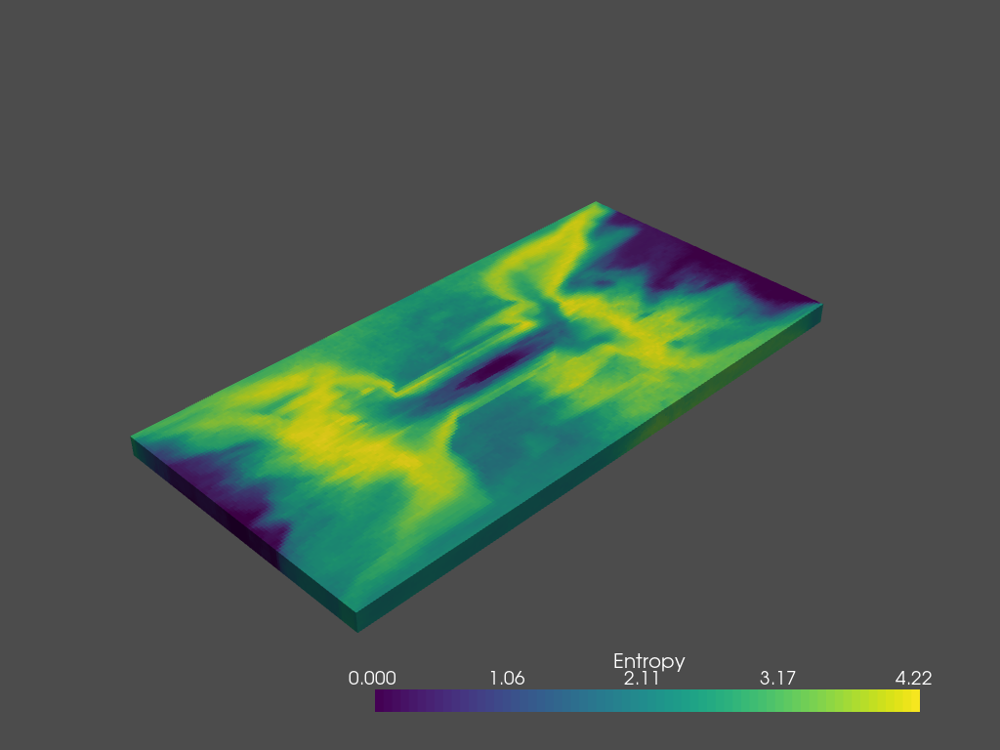

In [5]:
data.plot_tof_entropy()

### Plot one of the best models

In [4]:
data.plot_best_model(random_model = True,model_id = 0,property = "PORO")


Plotting Model 412

[Geometry] Converting GRDECL to Paraview Hexahedron mesh data....
     NumOfPoints 1120000
     NumOfCells 140000
     .....Done!
[Output] Writing "Results\GRID.vtu" Paraview file....Done!
[Output] Writing "Results\GRID.vtu" Paraview file....Done!
[Output] Writing "Results\GRID.vtp" VTP file..vtp file created.


C:\Users\bs48\AppData\Local\Continuum\anaconda_3\envs\ABRM\lib\site-packages\pyvista\plotting\plotting.py:3909: UserWarning:

`auto_close` ignored: by clicking the exit button, you have destroyed the render window and we have to close it out.



### Cluster best models with UMAP and HDBSCAN

In [8]:
data.clustering_tof_or_PSO(cluster_parameter="tof")

In [10]:
data.clustering_sweep_efficiency_or_F_Phi(cluster_parameter="sweep")

### Selection of models to save

In [41]:
data.cluster_model_selection(include_unclustered= False,cluster_parameter = "tof",n_reservoir_models=30)


### Save selected models, ready for flow simulation

In [20]:
data.save_best_clustered_models()

# Diversity Tests

In [5]:
import pyvista as pv
from pyentrp import entropy as ent
from skimage.util.shape import view_as_windows
from sklearn import preprocessing 
import hdbscan
import umap
import matplotlib. pyplot as plt
from GRDECL_file_reader.GRDECL2VTK import *


In [9]:
Model = GeologyModel(filename = "C:/AgentBased_RM/FD_Models/INCLUDE/GRID.GRDECL")
TempData=Model.LoadCellData(varname="PORO",filename='C:/AgentBased_RM/Output/2020_08_25_11_25/best_models/INCLUDE/PORO/M0.GRDECL')

### Feature importance - model explainability

In [16]:
import shap
from sklearn.ensemble import RandomForestRegressor


In [28]:
data.setup_all["2020_09_14_17_35"]["columns"]

['TI1',
 'F1_I_MIN',
 'F1_I_MAX',
 'F1_J_MIN',
 'F1_J_MAX',
 'F1_K_MIN',
 'F1_K_MAX',
 'TI2',
 'F2_I_MIN',
 'F2_I_MAX',
 'F2_J_MIN',
 'F2_J_MAX',
 'F2_K_MIN',
 'F2_K_MAX',
 'TI3',
 'F3_I_MIN',
 'F3_I_MAX',
 'F3_J_MIN',
 'F3_J_MAX',
 'F3_K_MIN',
 'F3_K_MAX',
 'F1_Curve_Prob',
 'F2_Curve_Prob',
 'F3_Curve_Prob',
 'FracpermX',
 'MatrixpermX',
 'FracpermY',
 'MatrixpermY',
 'FracpermZ',
 'MatrixpermZ']

In [30]:
columns = data.setup_all["2020_09_14_17_35"]["columns"]
X_train = data.df_position[columns]
Y_train = data.df_position.LC

In [31]:
# load JS visualization code to notebook
shap.initjs()

In [32]:
model = RandomForestRegressor(max_depth=6, random_state=0, n_estimators=10)
model.fit(X_train, Y_train)

RandomForestRegressor(max_depth=6, n_estimators=10, random_state=0)

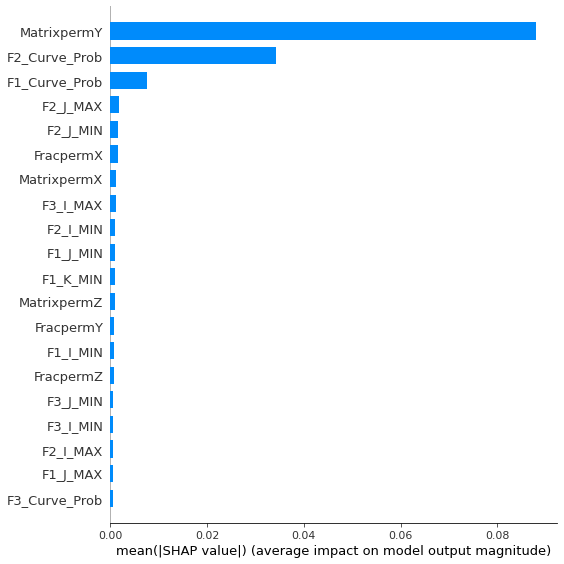

In [33]:
shap_values = shap.TreeExplainer(model).shap_values(X_train)
shap.summary_plot(shap_values, X_train, plot_type="bar")

In [34]:
# explain the model's predictions using SHAP
# (same syntax works for LightGBM, CatBoost, scikit-learn and spark models)
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_train)

# visualize the first prediction's explanation (use matplotlib=True to avoid Javascript)
shap.force_plot(explainer.expected_value, shap_values[80,:], X_train.iloc[80,:])

In [35]:
# visualize the training set predictions
shap.force_plot(explainer.expected_value, shap_values, X_train)

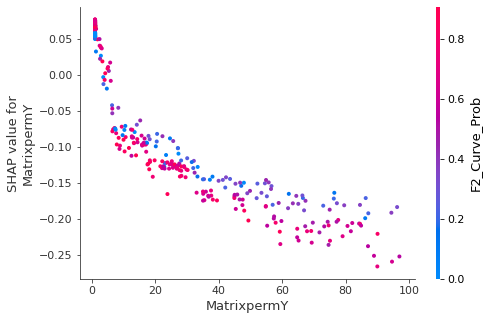

In [36]:
# create a dependence plot to show the effect of a single feature across the whole dataset
shap.dependence_plot("MatrixpermY", shap_values, X_train)

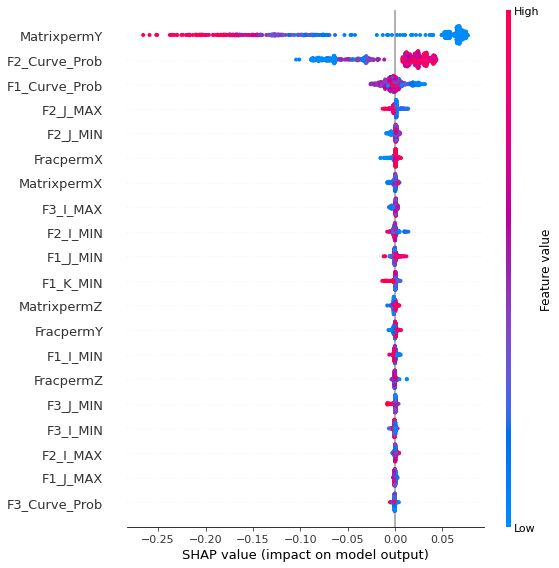

In [37]:
shap.summary_plot(shap_values, X_train)
